In [1]:
%matplotlib inline
%load_ext rpy2.ipython

import os
import glob
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context('notebook', font_scale=1.5)

In [2]:
def bilinear_interpolate(x, y, bins=None):
    """Returns interpolated density values on points (x, y).

    Ref: http://en.wikipedia.org/wiki/Bilinear_interpolation.
    """
    if bins is None:
        bins = int(np.sqrt(len(x)))

    z, unused_xedge, unused_yedge = np.histogram2d(
        y, x, bins=[
            bins, bins], range=[
            (np.min(y), np.max(y)), (np.min(x), np.max(x))])
    xfrac, xint = np.modf((x - np.min(x)) /
                             (np.max(x) - np.min(x)) * (bins - 1))
    yfrac, yint = np.modf((y - np.min(y)) /
                             (np.max(y) - np.min(y)) * (bins - 1))

    xint = xint.astype('i')
    yint = yint.astype('i')

    z1 = np.zeros(np.array(z.shape) + 1)
    z1[:-1, :-1] = z

    # values at corners of square for interpolation
    q11 = z1[yint, xint]
    q12 = z1[yint, xint + 1]
    q21 = z1[yint + 1, xint]
    q22 = z1[yint + 1, xint + 1]

    return q11 * (1 - xfrac) * (1 - yfrac) + q21 * (1 - xfrac) * (yfrac) + \
        q12 * (xfrac) * (1 - yfrac) + q22 * (xfrac) * (yfrac)
    
def plot_fcm(df, n, dims, ncols=None, lab=None, 
             panel_size=3, grid_count=None,
             mins=None, maxs=None):
    ndims = len(dims)

    if ncols is None:
        ncols = ndims
    nrows = (ndims + ncols - 1)//ncols

    fig, axes = plt.subplots(nrows, ncols, 
                             figsize=(panel_size*ncols, panel_size*nrows))
    axes = axes.ravel()
    for k, dim in enumerate(dims):
        ax = axes[k]
        c1, c2 = dim
        data = df.sample(n)
        x = data[c1]
        y = data[c2]
        z = bilinear_interpolate(x, y)
        if mins is not None:
            ax.set_xlim(mins[c1], maxs[c1])
        if maxs is not None:
            ax.set_ylim(mins[c2], maxs[c2]) 
        ax.scatter(x, y, s=1, c=z, edgecolors='none')
        if lab:
            plt.text(0.05, 0.9, lab,
                     va='center', ha='left',
                     transform=ax.transAxes)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_xlabel(c1.split()[0])
        ax.set_ylabel(c2.split()[0])
        if grid_count:
            xlim = ax.get_xlim()
            ylim = ax.get_ylim()
            ax.set_xticks(np.linspace(min(xlim), max(xlim), grid_count))
            ax.set_yticks(np.linspace(min(ylim), max(ylim), grid_count))
            ax.grid(True)
    plt.tight_layout()
    return fig

In [3]:
def plot_fcms(dfs, labs, dims, n,
              panel_size=3, grid_count=None,
              mins=None, maxs=None):

    ndims = len(dims)
    nrows = len(np.unique(dfs.index))
    ncols = ndims
    
    fig, axes = plt.subplots(nrows, ncols, 
                             figsize=(panel_size*ncols, panel_size*nrows))
    
    for i in range(nrows):
        df = dfs[dfs.index == (i+1)]
        lab = labs[i]
        axs = axes[i]

        for k, dim in enumerate(dims):
            ax = axs[k]
            c1, c2 = dim
            data = df.sample(n)
            x = data[c1]
            y = data[c2]
            z = bilinear_interpolate(x, y)
            if mins is not None:
                ax.set_xlim(mins[c1], maxs[c1])
            if maxs is not None:
                ax.set_ylim(mins[c2], maxs[c2]) 
            ax.scatter(x, y, s=1, c=z, edgecolors='none')
            if lab:
                plt.text(0.05, 0.9, lab,
                         va='center', ha='left',
                         transform=ax.transAxes)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_xlabel(c1.split()[0])
            ax.set_ylabel(c2.split()[0])
            if grid_count:
                xlim = ax.get_xlim()
                ylim = ax.get_ylim()
                ax.set_xticks(np.linspace(min(xlim), max(xlim), grid_count))
                ax.set_yticks(np.linspace(min(ylim), max(ylim), grid_count))
                ax.grid(True)
    plt.tight_layout()
    return fig

In [5]:
target_dir = '_'.join(('GEN070XT', 'CMVpp65'))

In [6]:
markers = [line.strip() for line in open(os.path.join(target_dir, 'markers.txt'))]

In [7]:
markers

['FSC-A',
 'SSC-A',
 'Aqua Amine FLR-A',
 'CD3 APC-H7 FLR-A',
 'CD4 PE-Cy7 FLR-A',
 'CD8 PerCP-Cy55 FLR-A',
 'TNFa FITC FLR-A',
 'IL2 BV421 FLR-A',
 'IFNg APC FLR-A',
 'CD107a PE FLR-A']

In [8]:
Y = np.loadtxt(os.path.join(target_dir, 'Y.csv'))

In [9]:
Y.shape

(180000, 10)

In [10]:
C = np.repeat(np.arange(1, 19), 10000)

In [11]:
C.shape

(180000,)

In [13]:
import pickle

In [14]:
with open('res0_GEN070XT_CMVpp65.pic', 'rb') as f:
    res = pickle.load(f)

In [16]:
%%R

library(MPSK)

In [17]:
%%time
%%R -i res -o cal

cal <- calibrate(res)

CPU times: user 31.9 s, sys: 3.78 s, total: 35.7 s
Wall time: 35.5 s


In [19]:
Y_cal = np.array(cal.rx2('Y_cal'))

## Skip the next two cells if alreeady done.

```R
%%time
%%R -i Y,C -o res

set.seed(1)
Y <- scale(Y)
res <- mpsk(Y, C)
```

Output
```bash
CPU times: user 13h 3min 35s, sys: 9h 2min 43s, total: 22h 6min 18s
Wall time: 3h 59min 36s
```

```python
with open('res0_GEN070XT_CMVpp65.pic', 'wb') as f:
    pickle.dump(res, f)
```

## Plots

In [20]:
labs = '001 004 007 010 012 031 043 048 082 003 006 008 011 013 036 044 049 101'.split()

In [21]:
dims = [
    ('FSC-A', 'SSC-A'),
    ('CD3 APC-H7 FLR-A', 'Aqua Amine FLR-A'),
    ('CD4 PE-Cy7 FLR-A', 'CD8 PerCP-Cy55 FLR-A'),
    ('CD3 APC-H7 FLR-A', 'IFNg APC FLR-A'),
    ('CD3 APC-H7 FLR-A', 'TNFa FITC FLR-A'),
    ('CD3 APC-H7 FLR-A', 'IL2 BV421 FLR-A'),
    ('CD3 APC-H7 FLR-A', 'CD107a PE FLR-A'),    
]

## Plot on normalized scale

In [76]:
df_raw = pd.DataFrame(Y, columns=markers, index=C)

In [36]:
df_cal = pd.DataFrame(Y_cal, columns=markers, index=C)

In [37]:
n = 10000

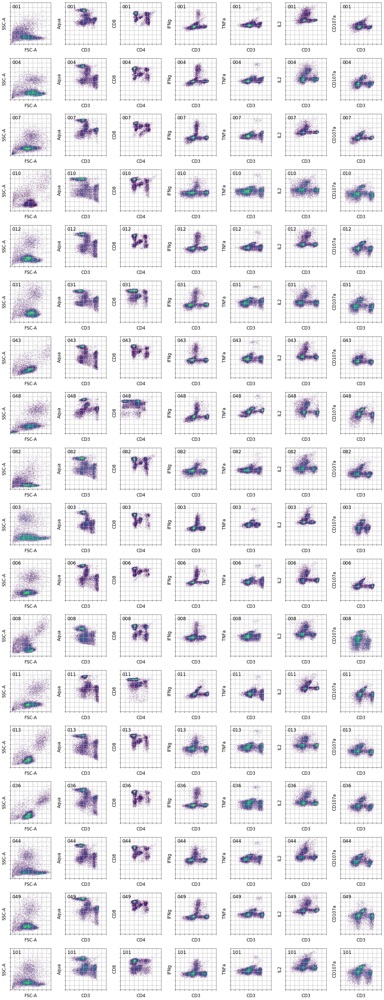

In [78]:
fig1 = plot_fcms(df_raw, labs, dims, n, panel_size=3, grid_count=10, 
                 mins=df_raw.min(axis=0), 
                 maxs=df_raw.max(axis=0))

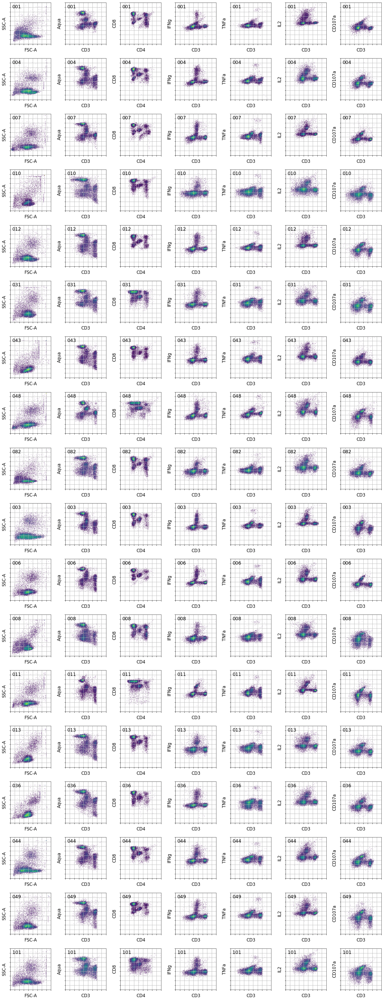

In [79]:
fig2 = plot_fcms(df_cal, labs, dims, n, panel_size=3, grid_count=10, 
                 mins=df_cal.min(axis=0), 
                 maxs=df_cal.max(axis=0))

In [80]:
fig1.savefig('figs/raw1.png', dpi=600)

In [81]:
fig2.savefig('figs/cal1.png', dpi=600)

## Gate

In [22]:
%%R -i Y -o Ys

Ys <- scale(Y)

In [23]:
Y1 = np.array(Ys)

In [24]:
df_Y1 = pd.DataFrame(Y1, columns=markers, index=C)

In [25]:
df_Y1.shape

(180000, 10)

In [26]:
df_Y1.index.unique()

Int64Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18], dtype='int64')

In [27]:
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection

In [28]:
def plot_fcms_gated(dfs, labs, dims, n, gates,
              panel_size=3, grid_count=None,
              mins=None, maxs=None):

    ndims = len(dims)
    nrows = len(np.unique(dfs.index))
    ncols = ndims
    
    fig, axes = plt.subplots(nrows, ncols, 
                             figsize=(panel_size*ncols, panel_size*nrows))
    
    for i in range(nrows):
        df = dfs[dfs.index == (i+1)]
        lab = labs[i]
        axs = axes[i]

        for k, dim in enumerate(dims):
            gate = gates[k]
            ax = axs[k]
            c1, c2 = dim
            data = df.sample(n)
            x = data[c1]
            y = data[c2]
            z = bilinear_interpolate(x, y)
            if mins is not None:
                ax.set_xlim(mins[c1], maxs[c1])
            if maxs is not None:
                ax.set_ylim(mins[c2], maxs[c2]) 
                
            if gate is not None:
                rect = Polygon(np.c_[gate[0], gate[1]], linewidth=2,edgecolor='r',facecolor='none')
                ax.add_patch(rect)
                
            ax.scatter(x, y, s=1, c=z, edgecolors='none')
            if lab:
                plt.text(0.05, 0.9, lab,
                         va='center', ha='left',
                         transform=ax.transAxes)
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_xlabel(c1.split()[0])
            ax.set_ylabel(c2.split()[0])
            if grid_count:
                xlim = ax.get_xlim()
                ylim = ax.get_ylim()
                ax.set_xticks(np.linspace(min(xlim), max(xlim), grid_count))
                ax.set_yticks(np.linspace(min(ylim), max(ylim), grid_count))
                ax.grid(True)
    plt.tight_layout()
    return fig

In [29]:
dims_gate = [
    ('FSC-A', 'SSC-A'),
    ('CD4 PE-Cy7 FLR-A', 'CD8 PerCP-Cy55 FLR-A'),
    ('CD3 APC-H7 FLR-A', 'TNFa FITC FLR-A')  
]

In [30]:
gates = [
    [[-1.5,-1.5,2.5,2.5], [0,-1.2,-1.2,0]], # FSC, SSC
    [[-1,-1,0.5,0.5], [-0.5,1.5,1.5,-0.5]], # CD4 CD8
    [[0.5,0.5,2.5,2.5], [7,4,4,7]],         # CD3 TNFa 
]

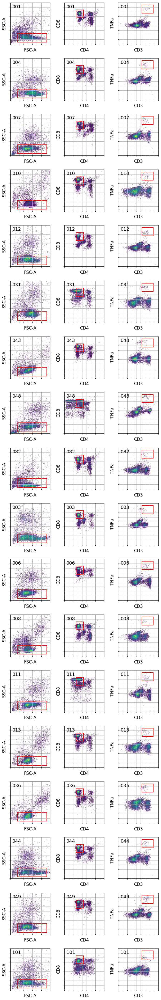

In [33]:
fig3 = plot_fcms_gated(df_Y1, labs, dims_gate, n, gates,
                       panel_size=3, grid_count=10, 
                 mins=df_Y1.min(axis=0), 
                 maxs=df_Y1.max(axis=0))

In [34]:
gates_cal = [
    [[-1.5,-1.5,2.5,2.5], [0,-1.2,-1.2,0]], # FSC, SSC
    [[-1.5,-1.5,0,0], [-0.5,1.5,1.5,-0.5]], # CD4 CD8
    [[0,0,2,2], [7,4,4,7]],                 # CD3 TNFa 
]

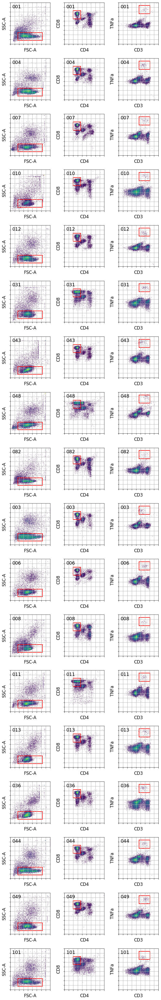

In [38]:
fig4 = plot_fcms_gated(df_cal, labs, dims_gate, n, gates_cal,
                       panel_size=3, grid_count=10, 
                 mins=df_cal.min(axis=0), 
                 maxs=df_cal.max(axis=0))

In [350]:
fig3.savefig('figs/raw1_gated.png', dpi=600)
fig4.savefig('figs/cal1_gated.png', dpi=600)

In [39]:
from MulticoreTSNE import MulticoreTSNE as TSNE

In [40]:
%%time

try:
    Z_raw = np.load('Z_raw.npy')
except:
    Z_raw = TSNE(n_jobs=8, random_state=123).fit_transform(Y1)
    np.save('Z_raw.npy', Z_raw)

CPU times: user 18min 58s, sys: 301 ms, total: 18min 58s
Wall time: 7min 25s


In [43]:
%%time
try:
    Z_cal = np.load('Z_cal.npy')
except:
    Z_cal = TSNE(n_jobs=8, random_state=123).fit_transform(Y_cal)
    np.save('Z_cal.npy', Z_cal)

CPU times: user 19min 32s, sys: 354 ms, total: 19min 33s
Wall time: 7min 51s


In [100]:
def plot_projectoin(Y, Z, labs, markers, cmap=plt.viridis()):
    
    if len(markers) > 0:
        m1_idx = markers.index(markers[0])
        m1 = (Y[:, m1_idx] - Y[:, m1_idx].min())/(Y[:, m1_idx].max() - Y[:, m1_idx].min()) 
        cs = m1
    if len(markers) == 2:
        m2_idx = markers.index(markers[1])
        m2 = (Y[:, m2_idx] - Y[:, m2_idx].min())/(Y[:, m2_idx].max() - Y[:, m2_idx].min())
        cs = m1 * m2
    
    cs = np.split(cs, len(labs))
    xs = np.split(Z, len(labs))
    fig, axes = plt.subplots(3, 6, figsize=(18, 9))
    axes = axes.ravel()
    for i, x in enumerate(xs):
        ax = axes[i]
        lab = labs[i]
        ax.scatter(x[:, 0], x[:, 1], s=1, edgecolors='None', 
                   c=cs[i], cmap=cmap, vmin=0, vmax=1)
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        plt.text(0.05, 0.9, lab,
                 va='center', ha='left',
                 transform=ax.transAxes)
    plt.tight_layout()
    return fig

<Figure size 432x288 with 0 Axes>

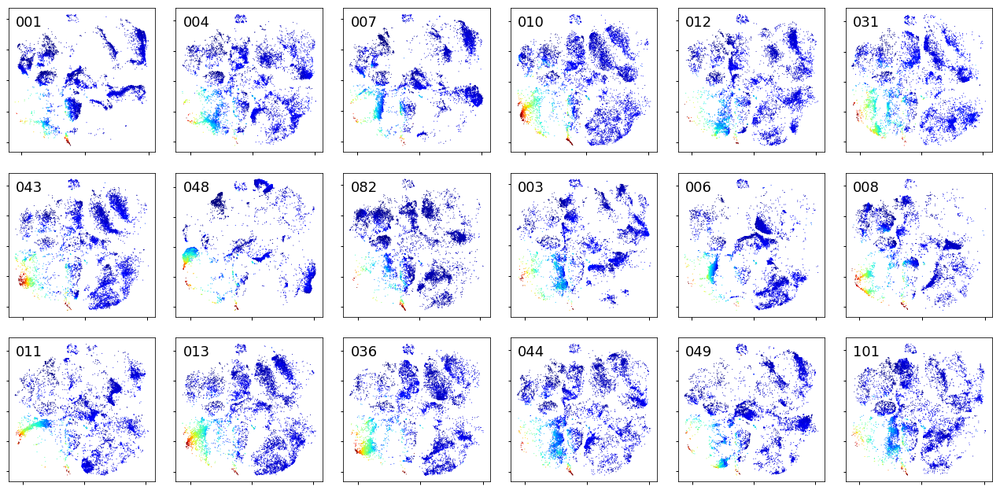

In [101]:
fig5 = plot_projectoin(Y1, Z_raw, labs, 
                       markers=['CD8 PerCP-Cy55 FLR-A','TNFa FITC FLR-A'],
                       cmap=plt.cm.jet)

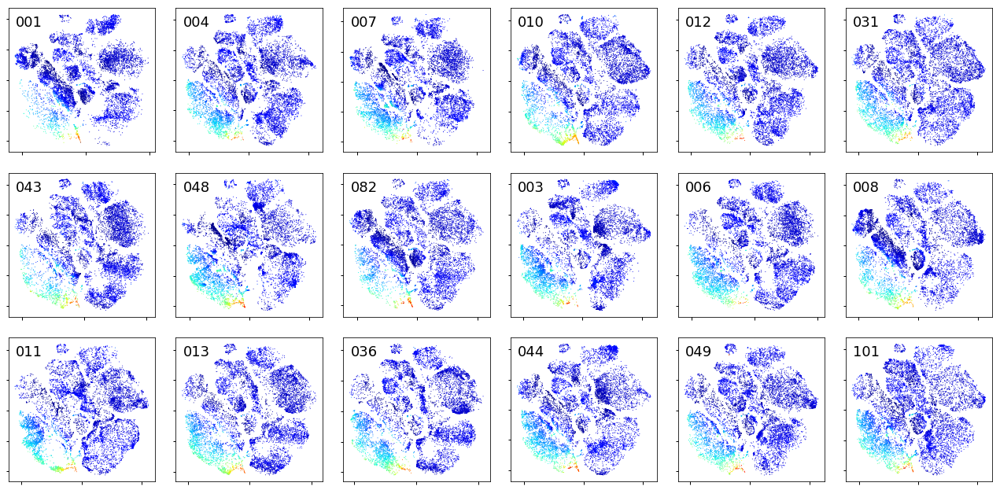

In [102]:
fig6 = plot_projectoin(Y_cal, Z_cal, labs, 
                       markers=['CD8 PerCP-Cy55 FLR-A','TNFa FITC FLR-A'],
                       cmap=plt.cm.jet)

In [99]:
fig5.savefig('figs/raw1_tsne.png', dpi=600)
fig6.savefig('figs/cal1_tsne.png', dpi=600)

In [117]:
from pyemd import emd_samples

In [122]:
raw_by_labs = np.split(Y1, 18)

In [123]:
cal_by_labs = np.split(Y_cal, 18)

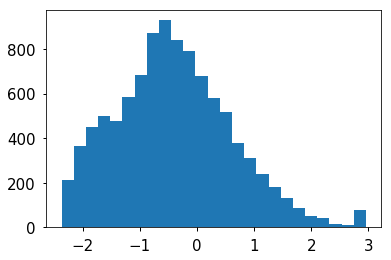

In [134]:
plt.hist(raw_by_labs[0][:, 0], 25)
pass

In [152]:
def emd_markers(samples, labs, ref_idx, bins=25):

    if ref_idx is None:
        n = len(samples[0])
        idx = np.random.choice(n*len(labs), n)
        ref_samples = np.concatenate(samples)[idx]
    else:
        ref_samples = samples[ref_idx]
        
    dists = {}
    for i, marker in enumerate(markers):
        ref = ref_samples[:, i]
        ds =  []
        for j, lab in enumerate(labs):
            if j != ref_idx:
                ds.append(emd_samples(samples[j][:, i], ref, bins=bins))
        dists[marker] = np.mean(ds)
    return dists

In [231]:
d1 = emd_markers(raw_by_labs, labs, ref_idx=None, bins=25)

In [232]:
d2 = emd_markers(cal_by_labs, labs, ref_idx=None, bins=25)

In [233]:
emds = pd.DataFrame(dict(raw=d1, cal=d2))

In [234]:
emds =  emds.reset_index()

In [235]:
emds

,index,raw,cal
0,Aqua Amine FLR-A,0.247029,0.087521
1,CD107a PE FLR-A,0.279847,0.134244
2,CD3 APC-H7 FLR-A,0.181503,0.079692
3,CD4 PE-Cy7 FLR-A,0.288876,0.183449
4,CD8 PerCP-Cy55 FLR-A,0.285111,0.094052
5,FSC-A,0.206604,0.142967
6,IFNg APC FLR-A,0.200373,0.096131
7,IL2 BV421 FLR-A,0.281002,0.086051
8,SSC-A,0.146622,0.081294
9,TNFa FITC FLR-A,0.242546,0.118833


In [236]:
import seaborn as sns

In [237]:
emd_tall = pd.melt(emds, id_vars='index', var_name='processing', value_name='emd')

In [238]:
emd_tall

,index,processing,emd
0,Aqua Amine FLR-A,raw,0.247029
1,CD107a PE FLR-A,raw,0.279847
2,CD3 APC-H7 FLR-A,raw,0.181503
3,CD4 PE-Cy7 FLR-A,raw,0.288876
4,CD8 PerCP-Cy55 FLR-A,raw,0.285111
5,FSC-A,raw,0.206604
6,IFNg APC FLR-A,raw,0.200373
7,IL2 BV421 FLR-A,raw,0.281002
8,SSC-A,raw,0.146622
9,TNFa FITC FLR-A,raw,0.242546


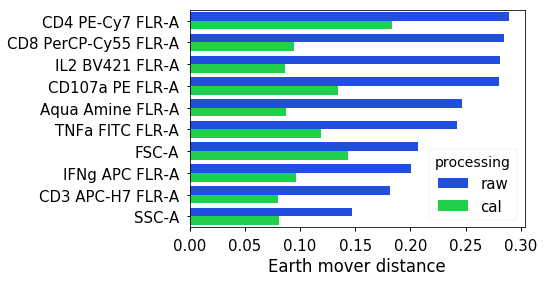

In [239]:
sns.set_palette('bright')
g = sns.barplot(data=emd_tall.sort_values('emd', ascending=False), 
                x='emd', y='index', hue='processing')
g.set_ylabel('')
g.set_xlabel('Earth mover distance')
plt.savefig('figs/distance.png', dpi=600)
pass

In [242]:
Y1[:3,:]

array([[-1.14163633, -0.09986633, -0.42106735,  0.77610139,  2.27313462,
         0.64444982, -0.1937829 , -0.02015737, -0.27344867,  0.60710339],
       [-0.84058928, -0.73858079,  1.24079568, -0.42224722, -0.56588007,
         0.65572095, -0.61185181, -0.02377409, -0.34964856, -0.03757027],
       [ 0.51071791, -0.84609384, -1.05982489, -0.36617888, -0.58892466,
        -1.85273536, -1.18404133, -0.03447264, -0.42590688, -0.02672243]])

In [243]:
np.save('/data/SMPK/Y_raw.npy', Y1)

In [246]:
np.save('/data/SMPK/C.npy', C)

In [244]:
markers

['FSC-A',
 'SSC-A',
 'Aqua Amine FLR-A',
 'CD3 APC-H7 FLR-A',
 'CD4 PE-Cy7 FLR-A',
 'CD8 PerCP-Cy55 FLR-A',
 'TNFa FITC FLR-A',
 'IL2 BV421 FLR-A',
 'IFNg APC FLR-A',
 'CD107a PE FLR-A']

In [245]:
np.savetxt('/data/SMPK/markers.txt', markers, fmt='%s')